In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import sys

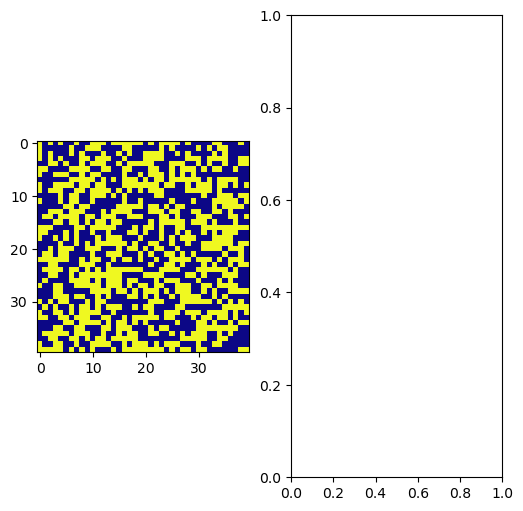

In [2]:
kB = 1
J = 1
T = 0.5
outside_energy_H = 0.1
p = lambda E: (math.e)**(-(E)/(kB*T))

def get_energy_of_particle(particles_in, i_in, j_in):
    sum = 0
    for move in [(i_in, (j_in+1)%particles_in.shape[1]), (i_in, (j_in-1)), ((i_in+1)%particles_in.shape[1], j_in), ((i_in-1), j_in)]:
        sum += particles_in[i_in][j_in]*particles_in[move[0]][move[1]]
    return -J*sum

def get_total_magnetism(particles_in):
    return abs((np.sum(particles_in))/(N**2))



N = 40
time_limit = 600


fig, (particles_ax, magnetism_ax) = plt.subplots(ncols=2, figsize=(6, 6))

particles = np.random.choice([-1, 1], size=(N, N))
magnetisms = np.empty(time_limit)
im = particles_ax.imshow(particles, cmap='plasma', vmin=-1, vmax=1)



def init():
    pass

def advance(frame, show_progress = True):
    if show_progress:
        sys.stdout.write("\r")
        sys.stdout.write(str(int(100*(frame/time_limit))) + "%")
        sys.stdout.flush()
    
    magnetisms[frame] = get_total_magnetism(particles)

    for _ in range(N**2):
        i = np.random.randint(0, N)
        j = np.random.randint(0, N)
        E1 = get_energy_of_particle(particles, i, j)
        particles[i][j] *= -1
        E2 = get_energy_of_particle(particles, i, j)
        particles[i][j] *= -1
        dE = (E2-E1) + 2*outside_energy_H
        if dE <= 0:
            particles[i][j] *= -1
        elif np.random.rand() < p(dE):
            particles[i][j] *= -1

def anim_init():
    im.set_array(particles)
    return (im, )

def anim_advance(frame):
    if frame == 0:
        return (im, )
    global particles

    advance(frame, True)
    
    im.set_array(particles)
    return (im, )

In [3]:
anim = FuncAnimation(
    fig,
    anim_advance,
    init_func=anim_init,
    frames=time_limit,
    interval=20,
    blit=True
)

magnetism_ax.clear()
magnetism_ax.plot(list(range(time_limit)), magnetisms, label="hello")
magnetism_ax.legend()
plt.show()
HTML(anim.to_jshtml())  # show as html

99%